In [222]:
#Importing all necessary libraries required for HW-5

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import RidgeCV,Ridge
from sklearn.linear_model import LassoCV,Lasso
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
import warnings
import pprint
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score


!python -m pip install scikit-multilearn
!python -m pip install xgboost
from skmultilearn.problem_transform import LabelPowerset
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score,classification_report
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

## Decision Trees as Interpretable Models

#### 1(a) Download the Accute Inflamations data from https://archive.ics.uci.edu/ml/datasets/Acute+Inflammations.

In [178]:
data = '../data/diagnosis.data'
df = pd.read_csv(data, sep='\s+', encoding='UTF_16', header=None, decimal=',')
df

,0,1,2,3,4,5,6,7
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


In [179]:
"""
Column Definitions: (a1) Patient's Temperature { 35C-42C }, (a2) Nausea { yes, no }
(a3) Lumbar Pain { yes, no }, (a4) Urine pushing (continuous need for urination) { yes, no }
(a5) Micturition Pains { yes, no }, (a6) Burning of urethra, itch, swelling of urethra outlet { yes, no }
(d1) Decision: Inflammation of urinary bladder{yes, no}, (d2) decision: Nephritis of renal pelvis origin { yes, no} 
"""
def ColumnData(file):
    if "diagnosis" in file:
        return ["a1", "a2", "a3", "a4", "a5", "a6", "d1", "d2"]

In [180]:
df.columns = ColumnData(data)
df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


### 1(b) Build a decision tree on the whole data set and plot it.

In [181]:
def getDataXYSplit(df):
    dataX = df.iloc[:, :-2]
    dataY1 = df.iloc[:, -2:-1]
    dataY2 = df.iloc[:, -1:]
    dataY1 = dataY1.astype('int')
    dataY2 = dataY2.astype('int')
    return dataX, dataY1, dataY2

def convertCategoricalToNumeric(df):
    columns = ColumnData(data)
    for col in columns:
        df.loc[df[col] == 'no', col] = 0
        df.loc[df[col] == 'yes', col] = 1
    return df

def DecisionTreeTextRepresentationAndPlot(dataX, dataY):
    classifier = DecisionTreeClassifier(random_state=50)
    model = classifier.fit(dataX, dataY)
    text = tree.export_text(classifier)
    print("*********************** TEXT REPRESENTATION OF DECISION TREE ***********************")
    print(text)
    print("****************************** PLOT OF DECISION TREE ******************************")
    tree.plot_tree(classifier, filled=True)
    return classifier

In [182]:
df = convertCategoricalToNumeric(df)
df

trainX, trainY1, trainY2 = getDataXYSplit(df)
print("Shape for trainX: ", trainX.shape)
print("Shape for trainY1: ", trainY1.shape)
print("Shape for trainY2: ", trainY2.shape)

Shape for trainX:  (120, 6)
Shape for trainY1:  (120, 1)
Shape for trainY2:  (120, 1)


*********************** TEXT REPRESENTATION OF DECISION TREE ***********************
|--- feature_3 <= 0.50
|   |--- class: 0
|--- feature_3 >  0.50
|   |--- feature_4 <= 0.50
|   |   |--- feature_0 <= 37.95
|   |   |   |--- class: 1
|   |   |--- feature_0 >  37.95
|   |   |   |--- class: 0
|   |--- feature_4 >  0.50
|   |   |--- class: 1

****************************** PLOT OF DECISION TREE ******************************


DecisionTreeClassifier(random_state=50)

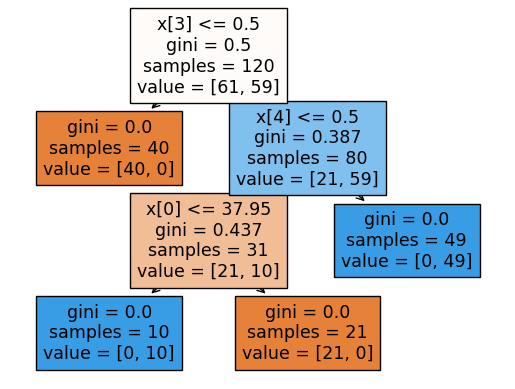

In [183]:
DecisionTreeTextRepresentationAndPlot(trainX, trainY1)

*********************** TEXT REPRESENTATION OF DECISION TREE ***********************
|--- feature_0 <= 37.95
|   |--- class: 0
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- class: 1

****************************** PLOT OF DECISION TREE ******************************


DecisionTreeClassifier(random_state=50)

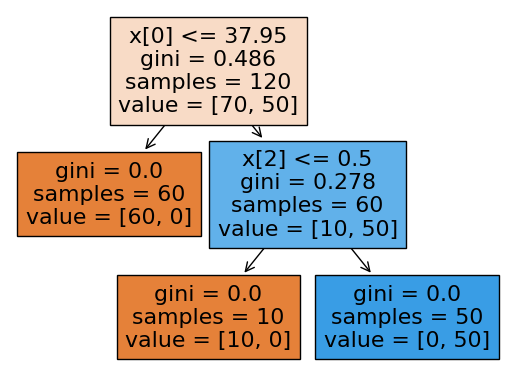

In [184]:
DecisionTreeTextRepresentationAndPlot(trainX, trainY2)

*********************** TEXT REPRESENTATION OF DECISION TREE ***********************
|--- feature_0 <= 37.95
|   |--- feature_3 <= 0.50
|   |   |--- class: 0
|   |--- feature_3 >  0.50
|   |   |--- class: 1
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- feature_4 <= 0.50
|   |   |   |--- class: 0
|   |   |--- feature_4 >  0.50
|   |   |   |--- feature_3 <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- feature_3 >  0.50
|   |   |   |   |--- class: 0

****************************** PLOT OF DECISION TREE ******************************


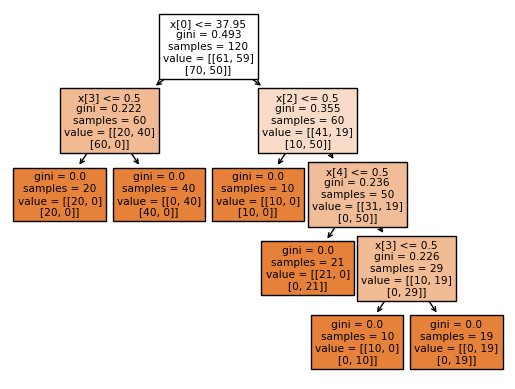

In [185]:
trainX = df.iloc[:, 0:6]
trainY = df.iloc[:, 6:]
trainY = trainY.astype('int')

classifier = DecisionTreeTextRepresentationAndPlot(trainX, trainY)

### 1(c). Convert the decision rules into a set of IF-THEN rules.

In [186]:
def IfThenDecisionRules(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!" for i in tree_.feature]
    print("def tree({}):".format(", ".join(feature_names)))

    def RecurseTree(node, depth):
        indent = "  " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print(f"{indent}if {name} <= {threshold}:")
            RecurseTree(tree_.children_left[node], depth + 1)
            print(f"{indent}else:  # if {name} > {threshold}")
            RecurseTree(tree_.children_right[node], depth + 1)
        else:
            print(f"{indent}return {tree_.value[node]}")

    RecurseTree(0, 1)

In [187]:
IfThenDecisionRules(classifier, df.columns[0:6])

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


### 1(d). Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

In [188]:
def BestScoreAndParameters():
    parameters = {'max_depth': ParametersForPruning()}
    classifier = GridSearchCV(DecisionTreeClassifier(random_state=50), parameters)
    classifier.fit(trainX, trainY)
    accurate_model = classifier.best_estimator_
    return { 'BestScore': round(classifier.best_score_, 4),
             'BestParams': classifier.best_params_,
             'AccurateModel': accurate_model }

def ParametersForPruning():
    ans = list(range(1, 10))
    return ans

bestScoreAndParamsWithAccurateModel = BestScoreAndParameters()
bestScore = bestScoreAndParamsWithAccurateModel['BestScore']
bestParams = bestScoreAndParamsWithAccurateModel['BestParams']
accurateModel = bestScoreAndParamsWithAccurateModel['AccurateModel']
print(f"Best Score is {bestScore}")
print(f"Best Params are {bestParams}")

Best Score is 0.95
Best Params are {'max_depth': 4}


Train Accuracy = 1.0
Test Accuracy = 1.0


[Text(0.4, 0.9, 'x[0] <= 37.95\ngini = 0.496\nsamples = 96\nvalue = [[48, 48]\n[54, 42]]'),
 Text(0.2, 0.7, 'x[3] <= 0.5\ngini = 0.208\nsamples = 44\nvalue = [[13, 31]\n[44, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 13\nvalue = [[13, 0]\n[13, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 31\nvalue = [[0, 31]\n[31, 0]]'),
 Text(0.6, 0.7, 'x[2] <= 0.5\ngini = 0.375\nsamples = 52\nvalue = [[35, 17]\n[10, 42]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[10, 0]]'),
 Text(0.7, 0.5, 'x[4] <= 0.5\ngini = 0.241\nsamples = 42\nvalue = [[25, 17]\n[0, 42]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 17\nvalue = [[17, 0]\n[0, 17]]'),
 Text(0.8, 0.3, 'x[3] <= 0.5\ngini = 0.218\nsamples = 25\nvalue = [[8, 17]\n[0, 25]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 8\nvalue = [[8, 0]\n[0, 8]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 17\nvalue = [[0, 17]\n[0, 17]]')]

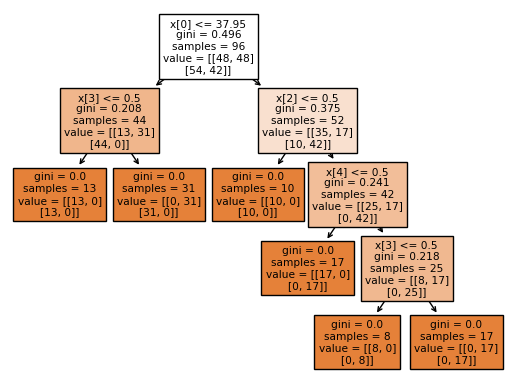

In [189]:
X_train, X_test, Y_train, Y_test = train_test_split(trainX, trainY, test_size=0.20)

best_alpha=0.0
best_classifier = DecisionTreeClassifier(random_state=50, ccp_alpha=best_alpha)
best_c = LabelPowerset(best_classifier)
best_classifier.fit(X_train, Y_train)
Y_train_pred = best_classifier.predict(X_train)
Y_test_pred = best_classifier.predict(X_test)

print(f"Train Accuracy = {accuracy_score(Y_train, Y_train_pred)}")
print(f"Test Accuracy = {accuracy_score(Y_test, Y_test_pred)}")
tree.plot_tree(best_classifier, filled=True)

In [190]:
IfThenDecisionRules(best_classifier, df.columns[0:6])

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[13.  0.]
 [13.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 31.]
 [31.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[17.  0.]
 [ 0. 17.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[8. 0.]
 [0. 8.]]
        else:  # if a4 > 0.5
          return [[ 0. 17.]
 [ 0. 17.]]


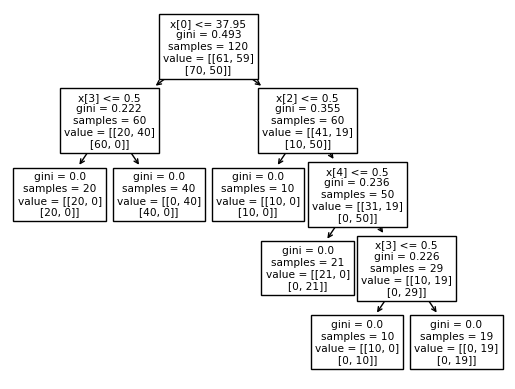

In [191]:
def DecisionRulesWithHighInterpretability():
    features = ['temperature', 'nausea_occurence', 'lumbar_pain', 'urine_pushing', 'micturition_pains', 'burning_urethra']
    features_d1_d2 = ['inflammation_pred', 'nephritis_pred']
    dot_data = tree.export_graphviz(accurateModel, out_file=None, 
                                    feature_names=features,  
                                    class_names=features_d1_d2,
                                    filled=True)
    tree.plot_tree(accurateModel)
    return features

# DOT Data
features = DecisionRulesWithHighInterpretability()

In [192]:
IfThenDecisionRules(accurateModel, features)

def tree(temperature, nausea_occurence, lumbar_pain, urine_pushing, micturition_pains, burning_urethra):
  if temperature <= 37.95000076293945:
    if urine_pushing <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if urine_pushing > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if temperature > 37.95000076293945
    if lumbar_pain <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if lumbar_pain > 0.5
      if micturition_pains <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if micturition_pains > 0.5
        if urine_pushing <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if urine_pushing > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


## The LASSO and Boosting for Regression

### 2(a). Download the Communities and Crime data from https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime. Use the first 1495 rows of data as the training set and the rest as the test set.

In [193]:
crimeData = "../data/communities.data"
crimeDataColumns = "../data/communities.names"

def ColumnsCrimeData(file):
    cols = []
    if 'communities' in file:
        f = open(file)
        for line in f:
            if "@attribute" in line:
                line = line.split(" ")
                cols.append(line[1])
        return cols;

cols = ColumnsCrimeData(crimeDataColumns)
df = pd.read_csv(crimeData, header=None, na_values='?')
df.columns = cols
df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [194]:
def SplitTrainTest(df):
    train = df.iloc[:1495,:]
    test = df.iloc[1495:, :]
    return (train, test)

training, testing = SplitTrainTest(df)
training

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,6,NaN,NaN,Hillsboroughtown,8,0.00,0.59,0.01,0.69,1.00,...,0.02,0.14,0.22,NaN,NaN,NaN,NaN,0.00,NaN,0.03
1491,6,NaN,NaN,Orangecity,8,0.16,0.62,0.03,0.74,0.48,...,0.07,0.40,0.14,0.07,0.05,0.85,0.5,0.61,0.19,0.20
1492,13,NaN,NaN,Waycrosscity,8,0.01,0.36,0.95,0.24,0.03,...,0.03,0.12,0.01,NaN,NaN,NaN,NaN,0.00,NaN,0.30
1493,39,85.0,49056.0,Mentorcity,8,0.06,0.53,0.01,0.98,0.05,...,0.08,0.15,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [195]:
testing

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,6,NaN,NaN,MillValleycity,8,0.00,0.20,0.03,0.91,0.23,...,0.01,0.23,0.73,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1496,48,NaN,NaN,LiveOakcity,8,0.00,0.55,0.13,0.78,0.15,...,0.01,0.18,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.11
1497,35,NaN,NaN,Portalescity,8,0.00,0.52,0.04,0.59,0.05,...,0.01,0.18,0.00,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1498,42,17.0,25112.0,Fallstownship,8,0.04,0.51,0.07,0.92,0.09,...,0.06,0.13,0.16,NaN,NaN,NaN,NaN,0.00,NaN,0.06
1499,51,683.0,48952.0,Manassascity,8,0.03,0.59,0.20,0.75,0.19,...,0.03,0.23,0.06,NaN,NaN,NaN,NaN,0.00,NaN,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


### 2(b) The data set has missing values. Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features

In [196]:
# using mean as a data imputation technique
def ColumnsToImputate(df):
    ImputatedData = df.isna().mean().round(5).mul(100).sort_values(ascending=False)
    colsImputated = ImputatedData[ImputatedData > 0].index
    return colsImputated

In [197]:
cols_to_imputate = ColumnsToImputate(df)
cols_to_imputate_df = pd.DataFrame(cols_to_imputate)
cols_to_imputate_df.columns = ['Columns to Imputate']
cols_to_imputate_df

,Columns to Imputate
0,PolicReqPerOffic
1,PolicAveOTWorked
2,PolicPerPop
3,RacialMatchCommPol
4,PctPolicWhite
5,PctPolicBlack
6,PctPolicHisp
7,PctPolicAsian
8,PctPolicMinor
9,OfficAssgnDrugUnits


In [198]:
import warnings
warnings.filterwarnings('ignore')

def impute(df):
    imputer = SimpleImputer(strategy='mean', missing_values=np.nan)
    for col in cols_to_imputate:
        imputer = imputer.fit(training[[col]])
        training[[col]] = imputer.transform(training[[col]])
        testing[[col]] = imputer.transform(testing[[col]])
    df_imputed=pd.concat([training,testing])
    return df_imputed

df_imputed = impute(df)
df_imputed

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,56.247974,46936.190244,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,53,56.247974,46936.190244,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,24,56.247974,46936.190244,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,34,5.000000,81440.000000,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,42,95.000000,6096.000000,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,56.247974,46936.190244,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,6,56.247974,46936.190244,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,9,9.000000,80070.000000,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,25,17.000000,72600.000000,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


### 2(c). Plot a correlation matrix for the features in the data set.

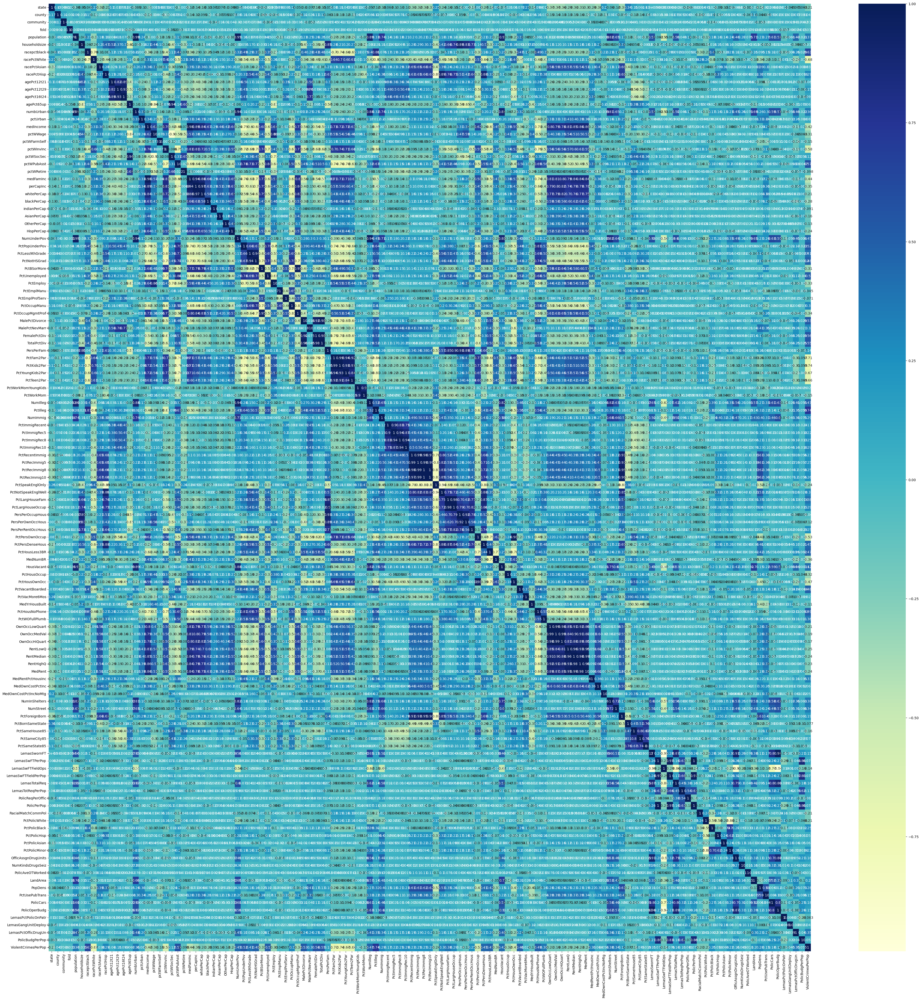

In [199]:
plt.figure(figsize=(50, 50))
corr = df_imputed.corr()
sns.heatmap(corr, cmap="YlGnBu", annot=True)
plt.show()

### 2(d). Calculate the Coefficient of Variation CV for each feature, where  𝐶𝑉=𝑠/𝑚, which  𝑠 is sample standard deviation and  𝑚 is sample mean.

In [200]:
def calculate_cv(df):
    describe = df_imputed.describe(include='all')
    std = describe.loc['std']
    mean = describe.loc['mean']
    describe.loc['CV'] = std / mean
    return describe.loc[['std','mean','CV']]

cv_features = calculate_cv(df)
cv_features

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
std,16.397553,81.051167,16192.703475,NaN,2.873694,0.126906,0.163717,0.253442,0.244039,0.208877,...,0.109459,0.203092,0.229055,0.085793,0.056023,0.085624,0.162153,0.240328,0.065815,0.232985
mean,28.683551,57.308486,46629.772777,NaN,5.493982,0.057593,0.463395,0.179629,0.753716,0.153681,...,0.065231,0.232854,0.161685,0.163835,0.079895,0.710740,0.450052,0.094052,0.191445,0.237979
CV,0.571671,1.414296,0.347261,NaN,0.523062,2.203503,0.353298,1.410920,0.323782,1.359162,...,1.678031,0.872187,1.416673,0.523655,0.701202,0.120471,0.360299,2.555266,0.343782,0.979015


### 2(e). Pick $b=\sqrt{128}$ features with highest $CV$, and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

In [201]:
def TopFeaturesWithHighestCV(df):    
    print("****************** Top Features with Highest CV ******************")
    end = int(np.sqrt(128))
    top_cv_features = cv_features.loc['CV'].sort_values(ascending=False)
    top_cv_features = top_cv_features[:end]
    return top_cv_features

top_cv_features = TopFeaturesWithHighestCV(cv_features)
top_cv_features

****************** Top Features with Highest CV ******************


NumStreet              4.407702
NumInShelters          3.485481
NumIlleg               2.994196
NumImmig               2.900497
LemasPctOfficDrugUn    2.555266
NumUnderPov             2.30497
population             2.203503
numbUrban              2.001744
HousVacant              1.95878
LandArea               1.678031
racePctHisp            1.614278
Name: CV, dtype: object

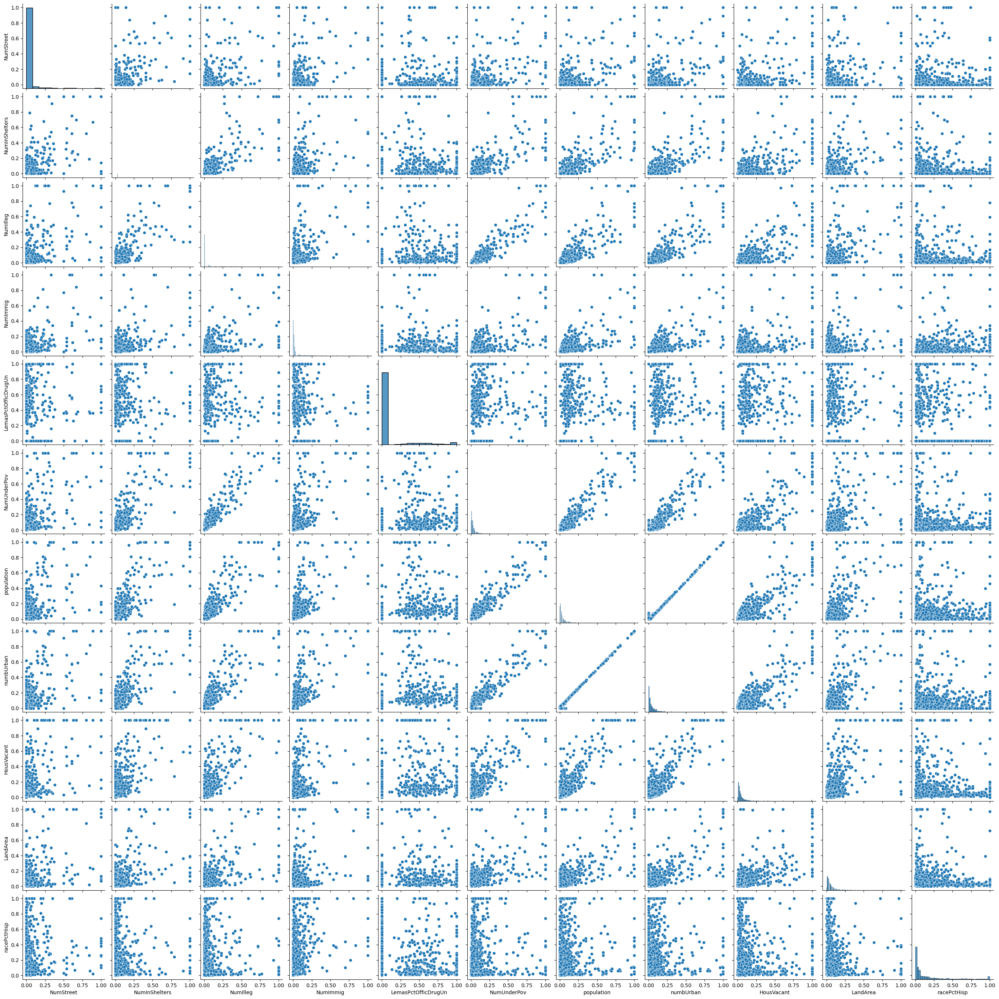

In [202]:
def PairPlot(df):
    sns.pairplot(df[top_cv_features.index])
    plt.show()

PairPlot(df_imputed)

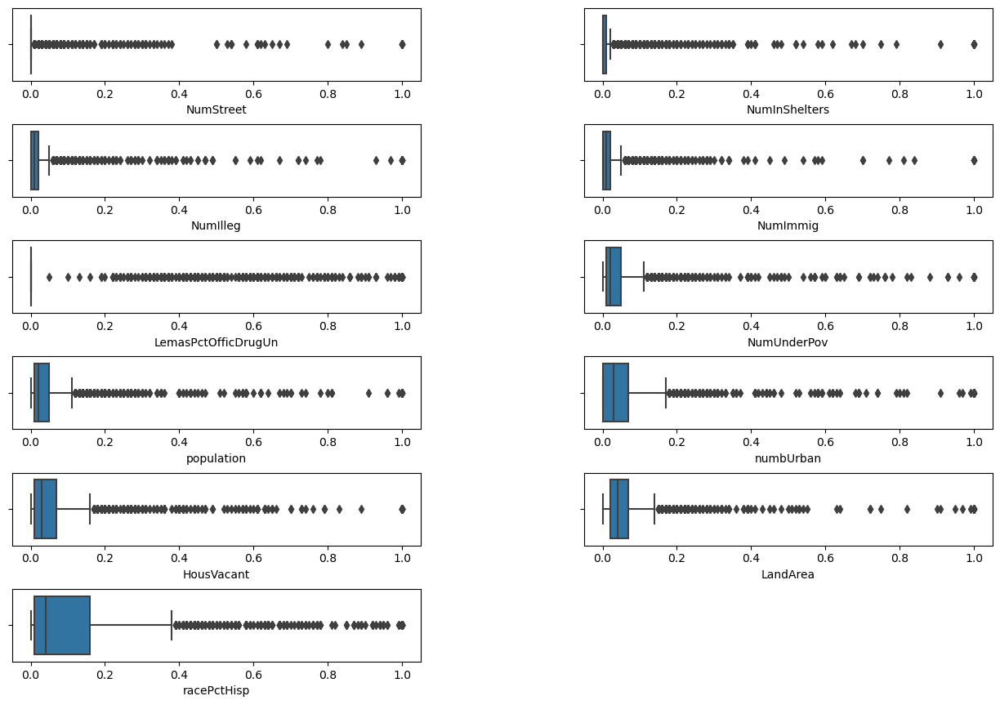

In [203]:
def ScatterPlot(df):
    count = len(top_cv_features)
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(top_cv_features.index):
        plt.subplot(6, 2, i + 1)
        sns.boxplot(x=col, data=df)
    plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.6)
    
ScatterPlot(df_imputed)

**The scatteplots are truely scattered/random and so we can say that no conclusion can be drawn solely from the scatterplot alone. However, combining a scatterplot with a boxplot seems to provide some insight especially when the datapoints increase.**

### 2(f). Fit a linear model using least squares to the training set and report the test error.

In [223]:
def get_X_Y_split(df):
    x_data = df.iloc[:, :-1]
    y_data = df.iloc[:, -1:]
    return x_data, y_data

trainX, trainY = get_X_Y_split(training)
testX, testY = get_X_Y_split(testing)

label_encoder = LabelEncoder()

trainX['communityname'] = label_encoder.fit_transform(trainX['communityname'])
testX['communityname'] = label_encoder.fit_transform(testX['communityname'])

def get_test_error(trainX, trainY, testX, testY):
    train_sm = sm.add_constant(trainX)
    model = sm.OLS(trainY, train_sm).fit()
    predicted_dataY = model.predict(train_sm)
    display(model.summary())
    mse_train = mean_squared_error(trainY, predicted_dataY)
    
    test_sm = sm.add_constant(testX)
    predicted_dataY_test = model.predict(test_sm)
    mse_test = mean_squared_error(testY, predicted_dataY_test)
    return round(mse_train, 4), round(mse_test, 4)

train_mse, test_mse = get_test_error(trainX, trainY, testX, testY)


#----------------------#----------------------#----------------------#----------------------#----------------------

# def fit_linear_model(trainX, trainY):
#     train_sm = sm.add_constant(trainX)
#     model = sm.OLS(trainY, train_sm).fit()
#     return model

# model = fit_linear_model(trainX, trainY)

# def predict_test_data(model, testX):
#     test_sm = sm.add_constant(testX)
#     predicted_dataY_test = model.predict(test_sm)
#     return predicted_dataY_test

# predicted_dataY_test = predict_test_data(model, testX)


# def calculate_test_error(testY, predicted_dataY_test):
#     mse_test = mean_squared_error(testY, predicted_dataY_test)
#     return mse_test

# test_error = calculate_test_error(testY, predicted_dataY_test)
# print(f"Test Error (MSE): {test_error:.4f}")

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ViolentCrimesPerPop   R-squared:                       0.714
Model:                             OLS   Adj. R-squared:                  0.687
Method:                  Least Squares   F-statistic:                     27.08
Date:                 Tue, 24 Oct 2023   Prob (F-statistic):          6.20e-290
Time:                         11:15:02   Log-Likelihood:                 962.26
No. Observations:                 1495   AIC:                            -1671.
Df Residuals:                     1368   BIC:                            -996.2
Df Model:                          126                                         
Covariance Type:             nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.5538      0.903      0.613      0.540      -1.218       2.325
state                    -0.0005      0.000     -1.522      0.128      -0.001       0.000
county                   -0.0001   5.37e-05     -2.473      0.014      -0.000   -2.74e-05
community             -1.743e-07   2.89e-07     -0.603      0.547   -7.42e-07    3.93e-07
communityname         -2.737e-06   1.17e-05     -0.234      0.815   -2.57e-05    2.02e-05
fold                     -0.0019      0.002     -1.128      0.259      -0.005       0.001
population                0.0115      0.477      0.024      0.981      -0.924       0.946
householdsize             0.0015      0.098      0.016      0.988      -0.191       0.194
racepctblack              0.2827      0.060      4.726      0.000       0.165       0.400
racePctWhite              0.0007      0.067      0.011      0.991      -0.130       0.131
racePctAsian             -0.0283      0.041     -0.684      0.494      -0.110       0.053
racePctHisp               0.0261      0.065      0.399      0.690      -0.102       0.154
agePct12t21               0.2018      0.129      1.560      0.119      -0.052       0.456
agePct12t29              -0.3352      0.185     -1.807      0.071      -0.699       0.029
agePct16t24              -0.1544      0.198     -0.781      0.435      -0.542       0.233
agePct65up                0.0325      0.124      0.262      0.793      -0.211       0.276
numbUrban                -0.1286      0.464     -0.277      0.782      -1.040       0.782
pctUrban                  0.0501      0.019      2.677      0.008       0.013       0.087
medIncome                -0.1920      0.202     -0.949      0.343      -0.589       0.205
pctWWage                 -0.1500      0.107     -1.401      0.162      -0.360       0.060
pctWFarmSelf              0.0429      0.023      1.831      0.067      -0.003       0.089
pctWInvInc               -0.1817      0.082     -2.225      0.026      -0.342      -0.021
pctWSocSec                0.1399      0.125      1.118      0.264      -0.106       0.385
pctWPubAsst               0.0487      0.054      0.895      0.371      -0.058       0.155
pctWRetire               -0.1234      0.045     -2.773      0.006      -0.211      -0.036
medFamInc                 0.3068      0.188      1.629      0.103      -0.063       0.676
perCapInc                -0.0243      0.221     -0.110      0.912      -0.458       0.410
whitePerCap              -0.2131      0.179     -1.190      0.234      -0.564       0.138
blackPerCap              -0.0381      0.030     -1.291      0.197      -0.096       0.020
indianPerCap             -0.0428      0.023     -1.879      0.060      -0.087       0.002
AsianPerCap               0.0275      0.022      1.265      0.206      -0.015       0.070
OtherPerCap 

**2(g). Fit a ridge regression model on the training set, with $\lambda$ chosen by cross-validation. Report the test error obtained.**

In [224]:
alphas = []
def get_alphas():
    for i in range(-10, 11, 1):
        alphas.append(10**i)
    return alphas

rr = RidgeCV(alphas=get_alphas(),
             cv=KFold(n_splits=5, random_state=1, shuffle=True),
             scoring='neg_mean_squared_error')
rr.fit(trainX, trainY)
print("Model info:", rr)

predictedY = rr.predict(testX)
chosen_alpha = rr.alpha_
test_mse = mean_squared_error(testY,predictedY)
test_r2 = r2_score(testY,predictedY)

stats = {
    "Chosen Alpha": [chosen_alpha],
    "Test MSE": [test_mse],
    "Test R2": [test_r2]
}

stats_df = pd.DataFrame(stats)
stats_df.T

Model info: RidgeCV(alphas=[1e-10, 1e-09, 1e-08, 1e-07, 1e-06, 1e-05, 0.0001, 0.001, 0.01,
                0.1, 1, 10, 100, 1000, 10000, 100000, 1000000, 10000000,
                100000000, 1000000000, 10000000000],
        cv=KFold(n_splits=5, random_state=1, shuffle=True),
        scoring='neg_mean_squared_error')


,0
Chosen Alpha,1.000000
Test MSE,0.017191
Test R2,0.638516


### 2(h). Fit a LASSO model on the training set, with 𝜆 chosen by cross-validation. Report the test error obtained, along with a list of the variables selected by the model. Repeat with standardized features. Report the test error for both cases and compare them

In [226]:
def LASSO_Model(train_x, train_y, test_x, test_y, is_standardized=False):
    scaler = StandardScaler()
    lr = LassoCV(alphas = get_alphas(),
                 cv = KFold(n_splits=5, random_state=50, shuffle=True),
                 max_iter = 10000)
    
    if is_standardized:
        train_x = scaler.fit_transform(train_x)
        test_x = scaler.fit_transform(test_x)
        
    lr.fit(train_x, train_y)
    predicted_y = lr.predict(test_x)

    chosen_alpha = lr.alpha_
    test_mse = mean_squared_error(test_y, predicted_y)
    test_r2 = r2_score(test_y,predicted_y)

    stats = {
        "Chosen Alpha": [chosen_alpha],
        "Test MSE": [test_mse],
        "Test R2": [test_r2]
    }

    stats_df = pd.DataFrame(stats)
    return stats_df.T, lr

lasso_df, lr = LASSO_Model(trainX, trainY, testX, testY)
lasso_df

,0
Chosen Alpha,0.000100
Test MSE,0.017310
Test R2,0.636011


In [231]:
def get_selected_variable_list():    
    lasso_dict_coef = {}
    count_cols = len(trainX.columns)
    for i in range(count_cols):    
        if lr.coef_[i] != 0:
            lasso_dict_coef[trainX.columns[i]] = [round(lr.coef_[i], 4)]

    print('Number of features: ', len(lasso_dict_coef))
    print('\n******************** PRINTING LASSO COEFFICIENTS ********************\n')
    pprint.pprint(lasso_dict_coef)
    
get_selected_variable_list()

Number of features:  85

******************** PRINTING LASSO COEFFICIENTS ********************

{'AsianPerCap': [0.0271],
 'FemalePctDiv': [-0.1147],
 'HispPerCap': [0.0287],
 'HousVacant': [0.1352],
 'LandArea': [0.0222],
 'LemasGangUnitDeploy': [0.0348],
 'LemasPctOfficDrugUn': [0.0037],
 'LemasPctPolicOnPatr': [0.0219],
 'LemasSwFTFieldPerPop': [0.0611],
 'LemasTotalReq': [-0.0156],
 'MalePctDivorce': [0.1466],
 'MalePctNevMarr': [0.1406],
 'MedNumBR': [0.008],
 'MedOwnCostPctInc': [-0.0162],
 'MedOwnCostPctIncNoMtg': [-0.0761],
 'MedRent': [0.1601],
 'MedRentPctHousInc': [0.0812],
 'MedYrHousBuilt': [-0.0203],
 'NumIlleg': [-0.0548],
 'NumImmig': [-0.0778],
 'NumInShelters': [0.0547],
 'NumKindsDrugsSeiz': [-0.0273],
 'NumStreet': [0.1622],
 'OfficAssgnDrugUnits': [-0.0148],
 'OtherPerCap': [0.0234],
 'OwnOccLowQuart': [-0.0497],
 'PctBSorMore': [0.0118],
 'PctEmplManu': [-0.012],
 'PctEmplProfServ': [0.0045],
 'PctEmploy': [0.1551],
 'PctForeignBorn': [0.0447],
 'PctHousLess3BR': 

In [232]:
lasso_standardized, lr = LASSO_Model(trainX, trainY, testX, testY, is_standardized=True)
lasso_standardized

,0
Chosen Alpha,0.001000
Test MSE,0.017544
Test R2,0.631083


In [233]:
get_selected_variable_list()

Number of features:  70

******************** PRINTING LASSO COEFFICIENTS ********************

{'AsianPerCap': [0.0046],
 'FemalePctDiv': [-0.0058],
 'HispPerCap': [0.0036],
 'HousVacant': [0.017],
 'LandArea': [0.0024],
 'LemasGangUnitDeploy': [0.0053],
 'LemasPctPolicOnPatr': [0.0021],
 'LemasSwFTFieldPerPop': [0.0064],
 'LemasTotalReq': [-0.0049],
 'MalePctDivorce': [0.0176],
 'MalePctNevMarr': [0.0134],
 'MedOwnCostPctInc': [-0.0012],
 'MedOwnCostPctIncNoMtg': [-0.0122],
 'MedRent': [0.0127],
 'MedRentPctHousInc': [0.0128],
 'MedYrHousBuilt': [-0.0029],
 'NumIlleg': [-0.0003],
 'NumImmig': [-0.0063],
 'NumInShelters': [0.0051],
 'NumKindsDrugsSeiz': [-0.0023],
 'NumStreet': [0.0173],
 'OfficAssgnDrugUnits': [-0.0034],
 'OtherPerCap': [0.0034],
 'OwnOccLowQuart': [-0.0003],
 'PctEmploy': [0.0142],
 'PctHousLess3BR': [0.0057],
 'PctHousNoPhone': [0.0009],
 'PctHousOccup': [-0.0112],
 'PctIlleg': [0.0244],
 'PctImmigRec5': [-0.0019],
 'PctKids2Par': [-0.0428],
 'PctOccupManu': [0.000

### 2(i). Fit a PCR model on the training set, with  𝑀 (the number of principal components) chosen by cross-validation. Report the test error obtained.

In [235]:
def pcr_model(train_x, train_y, dimension):
    scores=[]
    CV = 5
    job_count = -1
    pca = PCA(n_components = dimension)
    LR = LinearRegression(fit_intercept=True)    
    pipeline = make_pipeline(pca, LR)
    scores=cross_val_score(pipeline,
                           train_x,
                           train_y,
                           cv=CV,
                           n_jobs=job_count,
                           scoring="neg_mean_squared_error")
    
    return sum(abs(scores))/len(scores)

pcr_dict = {}
count_cols = len(train_X.columns)
for i in range(1,count_cols + 1):
    pcr_dict[i] = pcr_model(trainX, trainY, i)

pprint.pprint(pcr_dict)
minval=float('inf')
for key,value in pcr_dict.items():
    if value < minval:
        min_key = key
    minval = min(minval, value)

pcr_stats = {
    "Selected M": [min_key],
    "Minimum Validation Error": [minval]
}

pcr_df = pd.DataFrame(pcr_stats)
pcr_df

{1: 0.05647020499414842,
 2: 0.05634963813936379,
 3: 0.05627611360635267,
 4: 0.053786114579544096,
 5: 0.053814675860184916,
 6: 0.03347092931863792,
 7: 0.030078035819313363,
 8: 0.026663485351956357,
 9: 0.02384578373044503,
 10: 0.022354412202811175,
 11: 0.021585037340044758,
 12: 0.02060261073402999,
 13: 0.020086511495827512,
 14: 0.01994289465376544,
 15: 0.019851596430328754,
 16: 0.01989441089194332,
 17: 0.019893241852973982,
 18: 0.01980521497719486,
 19: 0.01985007730804367,
 20: 0.019843835629512658,
 21: 0.01985596290288754,
 22: 0.019875036058423397,
 23: 0.019955240845486784,
 24: 0.02002448548372185,
 25: 0.020100849855596244,
 26: 0.02010347124886955,
 27: 0.020034872390713478,
 28: 0.01988353853758331,
 29: 0.019862999236674526,
 30: 0.01989903313621283,
 31: 0.0199437953815237,
 32: 0.01990639076767268,
 33: 0.019900290992386268,
 34: 0.01982042159990193,
 35: 0.01979358648516439,
 36: 0.0197880786107116,
 37: 0.019804426794135854,
 38: 0.01981660394206698,
 39: 0

,Selected M,Minimum Validation Error
0,101,0.019416


In [236]:
def getPCATestError():    
    count_components = pcr_stats['Selected M'][0]
    pca = PCA(n_components = count_components).fit(trainX)
    pca_train = pca.transform(trainX)
    pca_test = pca.transform(testX)
    LR = LinearRegression().fit(pca_train, trainY)
    predicted_Y_test = LR.predict(pca_test)
    pca_test_mse = mean_squared_error(testY, predicted_Y_test)
    return round(pca_test_mse, 4)

print("PCA Test MSE: ", getPCATestError())

PCA Test MSE:  0.0179


### 2(j). In this section, we would like to fit a boosting tree to the data. As in classification trees, one can use any type of regression at each node to build a multivariate regression tree. Because the number of variables is large in this problem, one can use $L1$-penalized regression at each node. Such a tree is called $L1$-penalized gradient boosting tree. You can use XGBoost to fit the model tree. Determine $\alpha$ (the regularization term) using cross-validation.

In [238]:
stats_xgb = {}
for alpha in get_alphas():
    model = xgb.XGBRegressor(objective='reg:squarederror', reg_alpha = alpha, random_state = 50)
    score=cross_val_score(model, trainX, trainY, cv=KFold(5, shuffle=True,random_state=50), n_jobs=-1,
                          scoring="neg_mean_squared_error")
    val = sum(abs(score))/len(score)
    stats_xgb[alpha]= f'{round(val, 4)}'
    
pprint.pprint(stats_xgb)

minval=float('inf')
for key, value in stats_xgb.items():
    if float(value) < minval:
        minval = float(value)
        min_key = key

xgb_stats = {
    "Selected Alpha": [min_key],
    "Minimum Validation Error MSE": [minval]
}

xgb_df = pd.DataFrame(xgb_stats)
xgb_df

{1e-10: '0.0215',
 1e-09: '0.0215',
 1e-08: '0.0215',
 1e-07: '0.0215',
 1e-06: '0.0215',
 1e-05: '0.0216',
 0.0001: '0.0215',
 0.001: '0.0213',
 0.01: '0.0214',
 0.1: '0.0214',
 1: '0.021',
 10: '0.0222',
 100: '0.0565',
 1000: '0.0565',
 10000: '0.0565',
 100000: '0.0565',
 1000000: '0.0565',
 10000000: '0.0565',
 100000000: '0.0565',
 1000000000: '0.0565',
 10000000000: '0.0565'}


,Selected Alpha,Minimum Validation Error MSE
0,1,0.021


In [240]:
def get_xgb_test_error():
    model = xgb.XGBRegressor(objective='reg:squarederror',
                             reg_alpha = xgb_stats['Selected Alpha'][0], 
                             random_state = 50)
    model.fit(trainX,trainY)
    test_predicted_xgb = model.predict(testX)
    test_mse = mean_squared_error(testY,test_predicted_xgb)
    return test_mse

print("XGBoost Test MSE: ", round(get_xgb_test_error(), 4))

XGBoost Test MSE:  0.0171
